<center><h1>Rashinkar_Payal_HW6</h1></center>

Name: Payal Rashinkar
<br>
Github Username: PayalRashinkar
<br>
USC ID: 3885141903

## 1. Tree-Based Methods

Import packages

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
import warnings
from sklearn import metrics
from sklearn import preprocessing
from sklearn import svm
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
import xgboost
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE 

In [2]:
warnings.filterwarnings('ignore')

### (a) Download the APS Failure data

In [3]:
train=pd.read_csv("../data/Homework 6 Data/aps_failure_training_set.csv", skiprows=20)

In [4]:
train

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,neg,60874,na,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,neg,153002,na,664,186,0,0,0,0,0,...,998500,566884,1290398,1218244,1019768,717762,898642,28588,0,0
59996,neg,2286,na,2130706538,224,0,0,0,0,0,...,10578,6760,21126,68424,136,0,0,0,0,0
59997,neg,112,0,2130706432,18,0,0,0,0,0,...,792,386,452,144,146,2622,0,0,0,0
59998,neg,80292,na,2130706432,494,0,0,0,0,0,...,699352,222654,347378,225724,194440,165070,802280,388422,0,0


In [5]:
test=pd.read_csv("../data/Homework 6 Data/aps_failure_test_set.csv", skiprows=20)

In [6]:
test

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,60,0,20,12,0,0,0,0,0,...,1098,138,412,654,78,88,0,0,0,0
1,neg,82,0,68,40,0,0,0,0,0,...,1068,276,1620,116,86,462,0,0,0,0
2,neg,66002,2,212,112,0,0,0,0,0,...,495076,380368,440134,269556,1315022,153680,516,0,0,0
3,neg,59816,na,1010,936,0,0,0,0,0,...,540820,243270,483302,485332,431376,210074,281662,3232,0,0
4,neg,1814,na,156,140,0,0,0,0,0,...,7646,4144,18466,49782,3176,482,76,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,neg,81852,na,2130706432,892,0,0,0,0,0,...,632658,273242,510354,373918,349840,317840,960024,25566,0,0
15996,neg,18,0,52,46,8,26,0,0,0,...,266,44,46,14,2,0,0,0,0,0
15997,neg,79636,na,1670,1518,0,0,0,0,0,...,806832,449962,778826,581558,375498,222866,358934,19548,0,0
15998,neg,110,na,36,32,0,0,0,0,0,...,588,210,180,544,1004,1338,74,0,0,0


### (b) Data Preparation

#### (i) Research what types of techniques are usually used

In [7]:
train=train.replace(to_replace='na', value=np.nan)
train.head()

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,NaN,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,NaN,0,NaN,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,NaN,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,neg,60874,NaN,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0


In [8]:
test=test.replace(to_replace='na', value=np.nan)
test.head()

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,60,0,20,12,0,0,0,0,0,...,1098,138,412,654,78,88,0,0,0,0
1,neg,82,0,68,40,0,0,0,0,0,...,1068,276,1620,116,86,462,0,0,0,0
2,neg,66002,2,212,112,0,0,0,0,0,...,495076,380368,440134,269556,1315022,153680,516,0,0,0
3,neg,59816,NaN,1010,936,0,0,0,0,0,...,540820,243270,483302,485332,431376,210074,281662,3232,0,0
4,neg,1814,NaN,156,140,0,0,0,0,0,...,7646,4144,18466,49782,3176,482,76,0,0,0


In [9]:
x=train.columns.tolist()
x.remove('class')

In [10]:
train['class'].isnull().sum()

0

In [11]:
test['class'].isnull().sum()

0

In [12]:
data=pd.concat([train,test])
data.reset_index(drop=True,inplace=True)

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Columns: 171 entries, class to eg_000
dtypes: int64(1), object(170)
memory usage: 99.2+ MB


In [14]:
df1=data.drop(['class'],axis=1)
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
df1=imp.fit_transform(df1)
df1=pd.DataFrame(df1, columns=x)
df1.head()

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,76698.0,0.72556,2.130706e+09,280.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,33058.0,0.72556,0.000000e+00,150629.962105,0.0,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,41040.0,0.72556,2.280000e+02,100.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,12.0,0.00000,7.000000e+01,66.000000,0.0,10.0,0.0,0.0,0.0,318.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,60874.0,0.72556,1.368000e+03,458.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0


#### (ii) Calculate the coefficient of variation

In [15]:
CV={}
for i in df1.columns[:]:
    stdv=df1[i].std()
    mean=df1[i].mean()
    cv=stdv/mean
    CV[i]=cv
CV

{'aa_000': 4.328607835435785,
 'ab_000': 2.178272593946501,
 'ac_000': 2.167653308537832,
 'ad_000': 206.72149958173034,
 'ae_000': 22.293670429504104,
 'af_000': 18.209015502892044,
 'ag_000': 91.46065359583532,
 'ag_001': 42.08434252957034,
 'ag_002': 17.625908567425327,
 'ag_003': 8.753299520356636,
 'ag_004': 5.47511625543501,
 'ag_005': 2.9642299310403732,
 'ag_006': 2.3525878821684154,
 'ag_007': 2.81249797515666,
 'ag_008': 6.274980079892669,
 'ag_009': 32.16705734053613,
 'ah_000': 2.3155400947418996,
 'ai_000': 18.50630812878214,
 'aj_000': 43.14447956358602,
 'ak_000': 78.62298773591097,
 'al_000': 9.111991221645788,
 'am_0': 9.06719545392947,
 'an_000': 2.2542266522583647,
 'ao_000': 2.2761144767667583,
 'ap_000': 3.085884887396612,
 'aq_000': 2.853471317417563,
 'ar_000': 10.569202321812563,
 'as_000': 113.88275538316746,
 'at_000': 23.1870599282384,
 'au_000': 86.08563751143762,
 'av_000': 5.730485357529095,
 'ax_000': 3.8590349934226915,
 'ay_000': 40.902518755773414,
 'a

#### (iii) Plot a correlation matrix

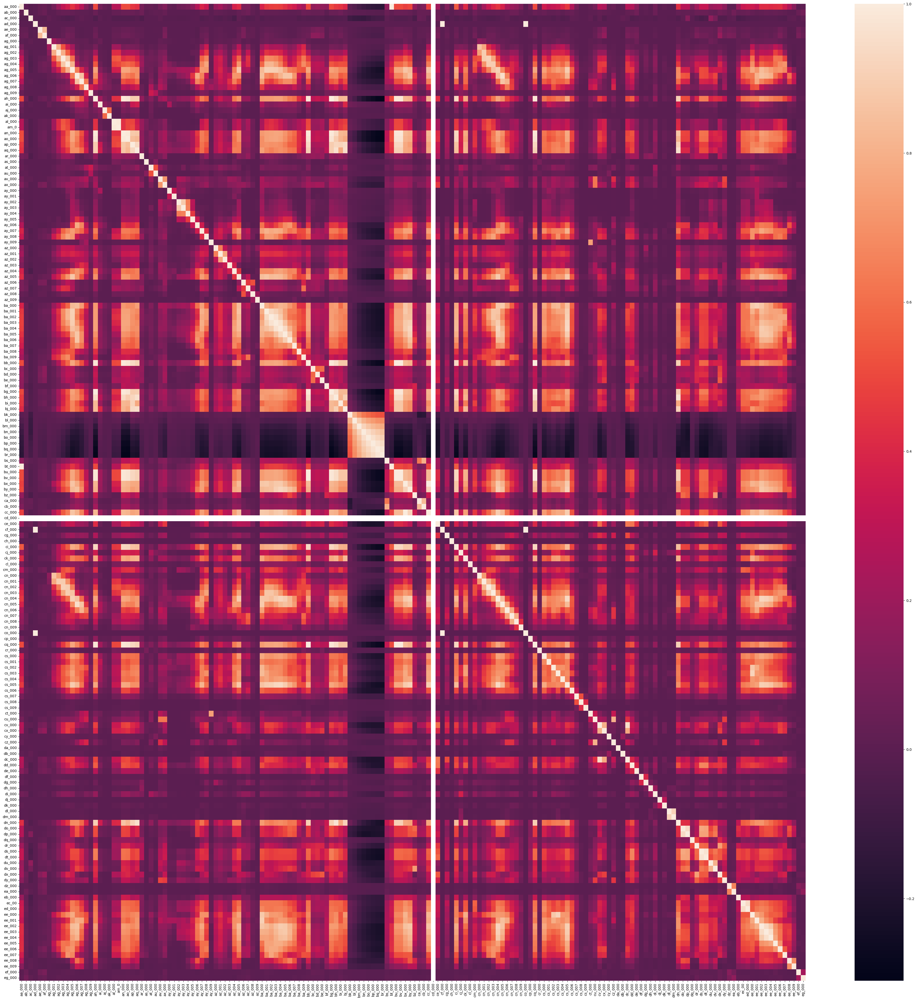

In [16]:
comat=df1.corr()
plt.figure(figsize=(50,50))
sns.heatmap(comat)
plt.show()

In [17]:
comat.style.background_gradient()

#### (iv) Make scatter plots and box plots

In [18]:
top_feat=math.floor(np.sqrt(170))
sort_CV={k: v for k, v in sorted(CV.items(), key=lambda item: item[1])}
top_features_list=[x for x in list(sort_CV)[-top_feat:]]
top_features_list.reverse()

In [19]:
top_feat=df1[top_features_list]
top_feat

,cf_000,co_000,ad_000,cs_009,dj_000,as_000,dh_000,df_000,ag_000,au_000,ak_000,az_009,ay_009
0,2.000000,220.000000,280.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,150231.156793,150517.375485,150629.962105,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.000000,0.000000,100.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2.000000,2.000000,66.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000000,202.000000,458.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
75995,2.000000,42.000000,892.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75996,2.000000,0.000000,46.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75997,2.000000,378.000000,1518.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75998,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


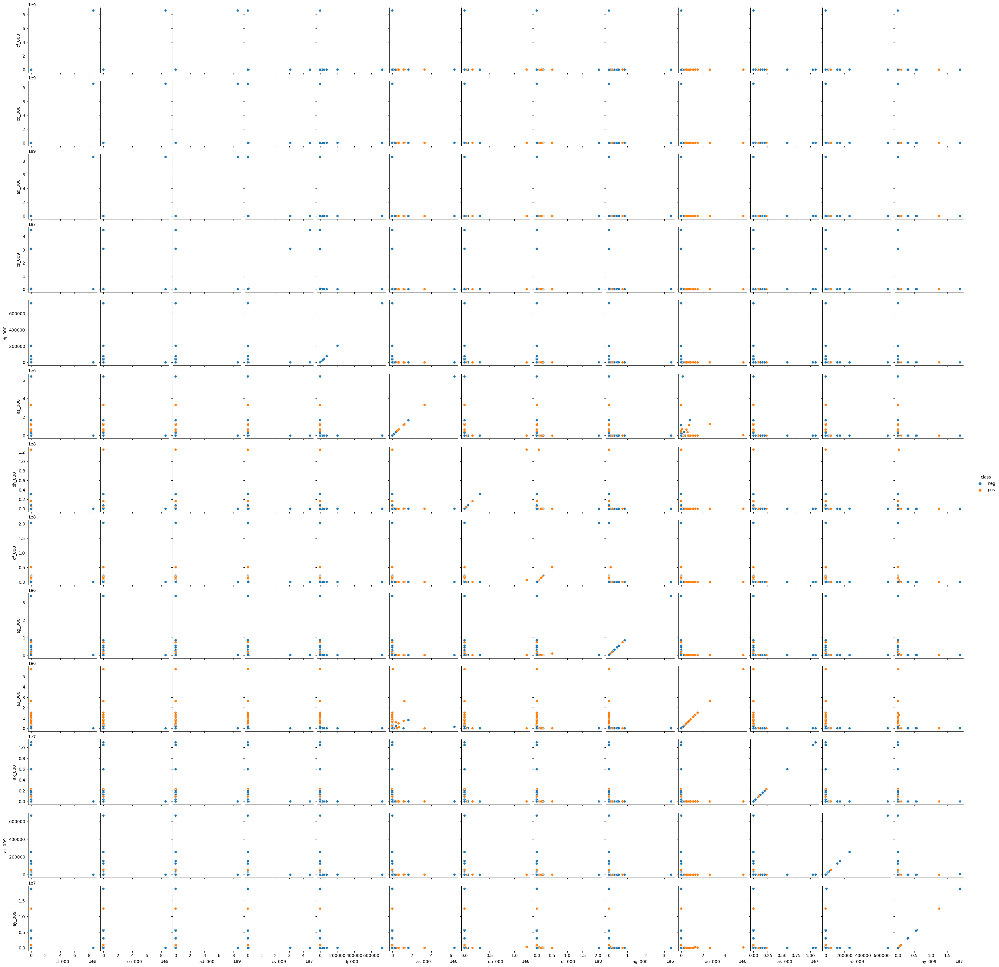

In [20]:
top_feat1=df1[top_features_list]
top_feat1['class']=data['class']
sns.pairplot(top_feat1, hue='class', diag_kind=None)

In [21]:
tf=top_feat.astype(np.uint8)
tf['class']=data['class']

<Figure size 5000x5000 with 0 Axes>

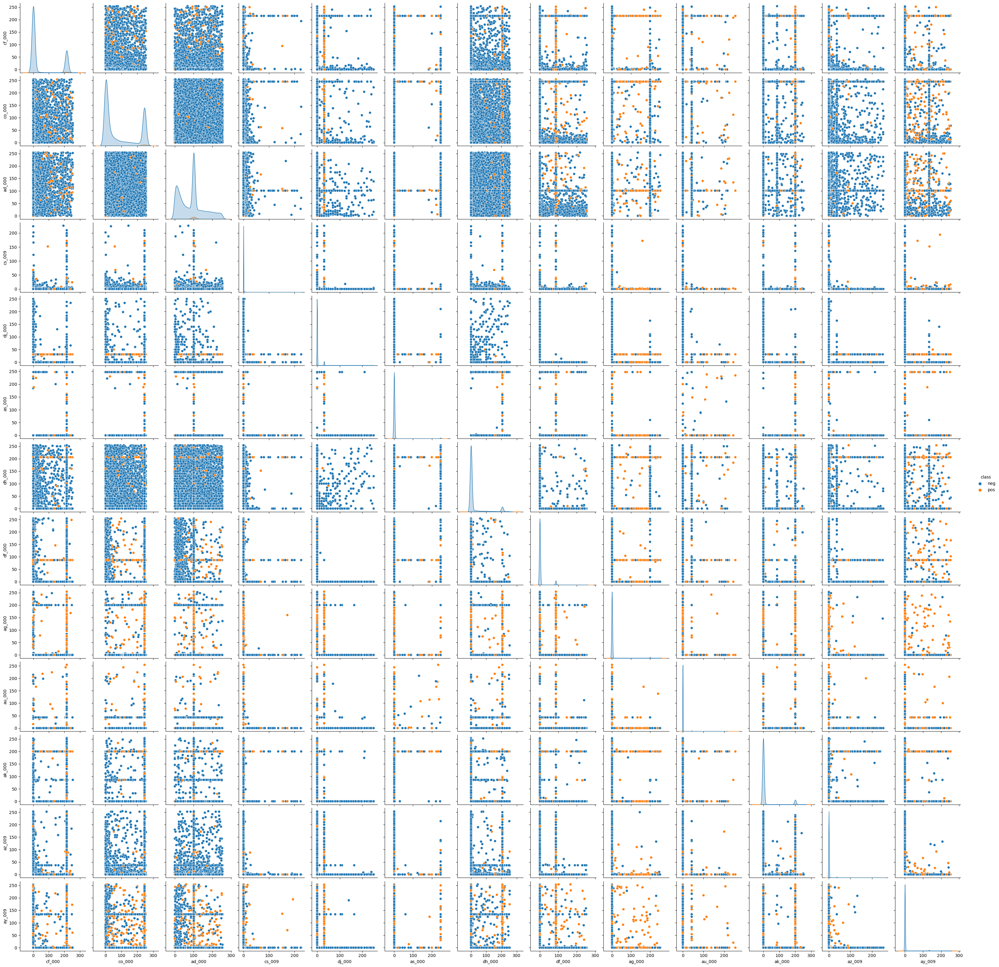

In [22]:
plt.figure(figsize=(50, 50))
sns.pairplot(tf, hue='class') 
plt.show()

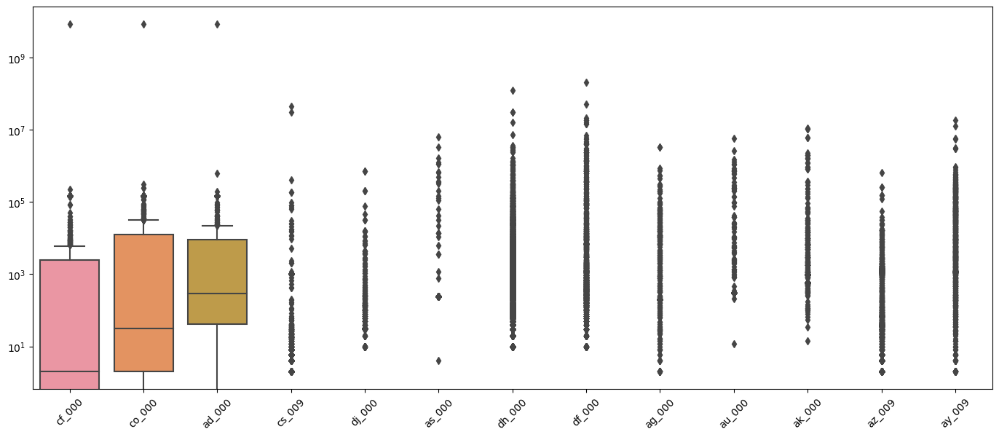

In [23]:
fig=plt.figure(figsize=(17,15))
ax=fig.add_subplot(2,1,1)
sns.boxplot(data=top_feat)
ax.set_yscale('log')
plt.xticks(rotation = 45)
plt.show()

In [24]:
df1['class']=data['class']
df1.head()

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000,class
0,76698.0,0.72556,2.130706e+09,280.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0,neg
1,33058.0,0.72556,0.000000e+00,150629.962105,0.0,0.0,0.0,0.0,0.0,0.0,...,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0,neg
2,41040.0,0.72556,2.280000e+02,100.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0,neg
3,12.0,0.00000,7.000000e+01,66.000000,0.0,10.0,0.0,0.0,0.0,318.0,...,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0,neg
4,60874.0,0.72556,1.368000e+03,458.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0,neg


Observation: 
    The scatterplots exhibit a highly dispersed distribution, indicating a lack of discernible patterns or trends 
    that can be reliably inferred solely from the scatterplot alone.The utilization of mean imputation as the strategy for handling missing values may be susceptible to the 
    influence of outliers, potentially distorting the data points and further undermining the ability to draw 
    meaningful conclusions from the scatterplots.

#### (v) Is this data set imbalanced?

In [25]:
occurrence=df1.groupby(['class']).size()
print(occurrence)

class
neg    74625
pos     1375
dtype: int64


In [26]:
train1=df1.iloc[0:60000]
test1=df1.iloc[60000:]

In [27]:
otr=train1.groupby(['class']).size()
print(otr)

class
neg    59000
pos     1000
dtype: int64


In [28]:
ote=test1.groupby(['class']).size()
print(ote)

class
neg    15625
pos      375
dtype: int64


We can see that the data is highly imbalanced as the no of neg instances = 74625 and the no of positive instances = 1375

### (c) Train a random forest

In [29]:
X_train=train1[train1.columns.difference(['class'])]
y_train=train1[['class']]
X_test=test1[test1.columns.difference(['class'])]
y_test=test1[['class']]
clf= RandomForestClassifier(oob_score=True, random_state=8) #, max_depth=5
clf.fit(X_train,y_train)
ypred=clf.predict(X_train)
prob=clf.predict_proba(X_train)

In [30]:
cm=confusion_matrix(y_train, ypred)
print(cm)
print('Accuracy on train set:', accuracy_score(y_train, ypred))
print('Misclassification rate on train set:', 1-accuracy_score(y_train, ypred))

[[59000     0]
 [    0  1000]]
Accuracy on train set: 1.0
Misclassification rate on train set: 0.0


In [31]:
def metric(prob, orig_label, _set):
    fpr, tpr, threshold = metrics.roc_curve(orig_label, prob[:, 1], pos_label='pos')
    area_under_curve = metrics.auc(fpr, tpr)
    fig, axes = plt.subplots(figsize=(6,6))
    axes.plot(fpr, tpr)
    axes.set_xlabel('False Positive Rate')
    axes.set_ylabel('True Positive Rate')
    axes.plot([0,1],[0,1])
    axes.set_title('ROC Curve')
    plt.show()
    print('AUC for',_set,'is:', area_under_curve)

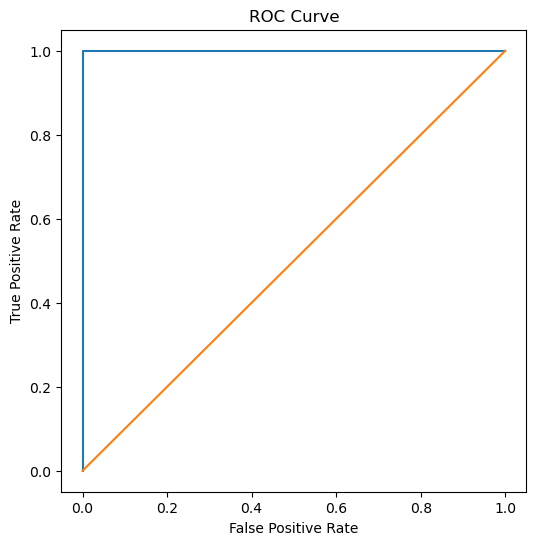

AUC for Training Set is: 1.0


In [32]:
metric(prob, y_train, 'Training Set')

In [33]:
ypred1=clf.predict(X_test)
prob1=clf.predict_proba(X_test)

In [34]:
cm1=confusion_matrix(y_test, ypred1)
print(cm1)
print('Accuracy on test set:', accuracy_score(y_test, ypred1))
print('Misclassification rate on test set:', 1-accuracy_score(y_test, ypred1))

[[15608    17]
 [  106   269]]
Accuracy on test set: 0.9923125
Misclassification rate on test set: 0.007687499999999958


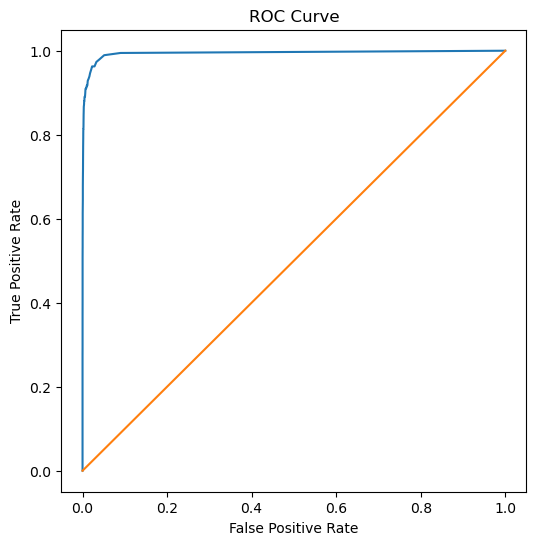

AUC for Testing Set is: 0.9942915413333333


In [35]:
metric(prob1, y_test, 'Testing Set')

In [36]:
oob_error=1-clf.oob_score_
print("Out of Bag error estimate:",oob_error)
print("Test err:",1-accuracy_score(y_test, ypred1))

Out of Bag error estimate: 0.0059833333333333405
Test err: 0.007687499999999958


The out of bag error estimate is less than test error

### (d) Research class imbalance in random forest

In [37]:
clf_b=RandomForestClassifier(oob_score=True, random_state=8, class_weight='balanced')
clf_b.fit(X_train,y_train)
ypred_b=clf_b.predict(X_train)
prob_b=clf_b.predict_proba(X_train)

In [38]:
cm2=confusion_matrix(y_train, ypred_b)
print(cm2)
print('Accuracy on train set:', accuracy_score(y_train, ypred_b))
print('Misclassification rate on train set:', 1-accuracy_score(y_train, ypred_b))

[[59000     0]
 [    0  1000]]
Accuracy on train set: 1.0
Misclassification rate on train set: 0.0


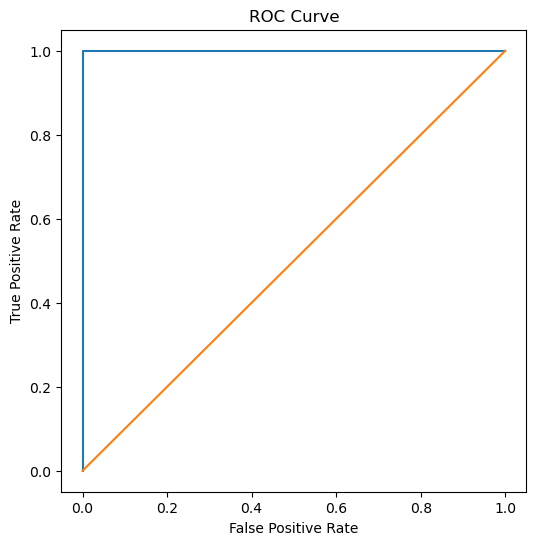

AUC for Training Set is: 1.0


In [39]:
metric(prob_b, y_train, 'Training Set')

In [40]:
ypred_b1=clf_b.predict(X_test)
prob_b1=clf_b.predict_proba(X_test)

In [41]:
cm3=confusion_matrix(y_test, ypred_b1)
print(cm3)
print('Accuracy of Random Forest on training set:', accuracy_score(y_test, ypred_b1))
print('Misclassification rate for the training set:', 1-accuracy_score(y_test, ypred_b1))

[[15611    14]
 [  159   216]]
Accuracy of Random Forest on training set: 0.9891875
Misclassification rate for the training set: 0.010812500000000003


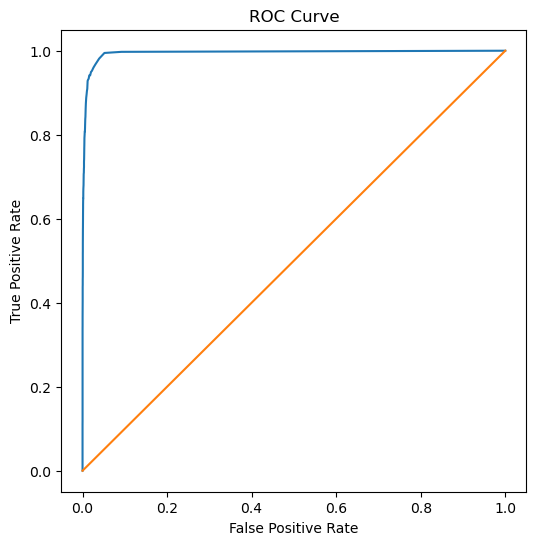

AUC for Testing Set is: 0.9947295573333332


In [42]:
metric(prob_b1, y_test, 'Testing Set')

In [43]:
oob_error1=1-clf_b.oob_score_
print("Out of Bag error estimate for my random forest is ",oob_error1)
print("Test error is ",1-accuracy_score(y_test, ypred_b1))

Out of Bag error estimate for my random forest is  0.007633333333333381
Test error is  0.010812500000000003


The out of bag error estimate is less than test error

Not addressing class imbalance works better as number of true positives is 269 compared to 216

### (e) XGBoost and Model Trees

In [44]:
xgb=xgboost.XGBClassifier(objective='reg:logistic', random_state=8, use_label_encoder=False, eval_metric='logloss' )
params={'reg_alpha':[10.0**i for i in np.arange(-4,4,1)]}
xgb_og= GridSearchCV(xgb, params, cv= StratifiedKFold(5), verbose= 4)

In [45]:
le=preprocessing.LabelEncoder()
df1['class']=le.fit_transform(data['class'])

In [46]:
train2=df1.iloc[:60000]
test2=df1.iloc[60000:]
y_train1=train2[['class']]
y_test1=test2[['class']]

In [47]:
xgb_og.fit(X_train,y_train1)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV 1/5] END ..................reg_alpha=0.0001;, score=0.995 total time=  18.4s
[CV 2/5] END ..................reg_alpha=0.0001;, score=0.995 total time=  17.9s
[CV 3/5] END ..................reg_alpha=0.0001;, score=0.994 total time=  18.1s
[CV 4/5] END ..................reg_alpha=0.0001;, score=0.995 total time=  18.1s
[CV 5/5] END ..................reg_alpha=0.0001;, score=0.994 total time=  18.0s
[CV 1/5] END ...................reg_alpha=0.001;, score=0.994 total time=  17.8s
[CV 2/5] END ...................reg_alpha=0.001;, score=0.995 total time=  17.6s
[CV 3/5] END ...................reg_alpha=0.001;, score=0.995 total time=  17.3s
[CV 4/5] END ...................reg_alpha=0.001;, score=0.995 total time=  17.9s
[CV 5/5] END ...................reg_alpha=0.001;, score=0.994 total time=  17.9s
[CV 1/5] END ....................reg_alpha=0.01;, score=0.995 total time=  17.6s
[CV 2/5] END ....................reg_alpha=0.01;,

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False,
                                     eval_metric='logloss', feature_types=None,
                                     gamma=None, gpu_id=None, grow_policy=None,
                                     import...
                                     learning_rate=None, max_bin=None,
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None,
                                     objective='reg:logistic', predictor=None, ...),
             param_grid={'reg_alpha': [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0,
                                       100.0, 1000.0]},
             verbose=4)

In [48]:
y_pred_xgb_tr=xgb_og.predict(X_train)

In [49]:
cm4=confusion_matrix(y_train1, y_pred_xgb_tr)
print(cm4)
print('Accuracy on train set:', accuracy_score(y_train1, y_pred_xgb_tr))
print('Misclassification rate on train set:', 1-accuracy_score(y_train1, y_pred_xgb_tr))

[[59000     0]
 [    1   999]]
Accuracy on train set: 0.9999833333333333
Misclassification rate on train set: 1.666666666666483e-05


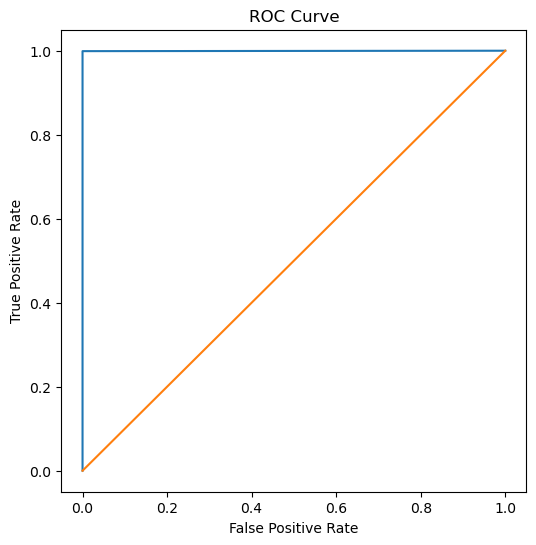

AUC for train set: 0.9995


In [50]:
fpr, tpr, threshold = metrics.roc_curve(y_train1, y_pred_xgb_tr)
area_under_curve = metrics.auc(fpr, tpr)
fig, axes = plt.subplots(figsize=(6,6))
axes.plot(fpr, tpr)
axes.set_xlabel('False Positive Rate')
axes.set_ylabel('True Positive Rate')
axes.plot([0,1],[0,1])
axes.set_title('ROC Curve')
plt.show()
print('AUC for train set:', area_under_curve)

In [51]:
y_pred_xgb_te=xgb_og.predict(X_test)

In [52]:
cm5=confusion_matrix(y_test1, y_pred_xgb_te)
print(cm5)
print('Accuracy on test set:', accuracy_score(y_test1, y_pred_xgb_te))
print('Misclassification rate on test set:', 1-accuracy_score(y_test1, y_pred_xgb_te))

[[15611    14]
 [   81   294]]
Accuracy on test set: 0.9940625
Misclassification rate on test set: 0.00593750000000004


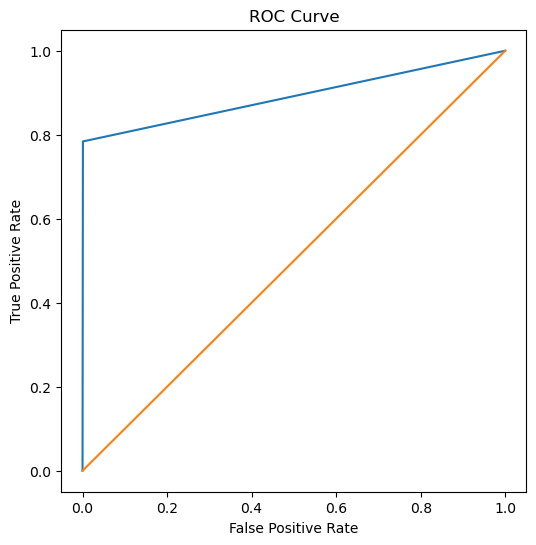

AUC for test set: 0.891552


In [53]:
fpr, tpr, threshold = metrics.roc_curve(y_test1, y_pred_xgb_te)
area_under_curve = metrics.auc(fpr, tpr)
fig, axes = plt.subplots(figsize=(6,6))
axes.plot(fpr, tpr)
axes.set_xlabel('False Positive Rate')
axes.set_ylabel('True Positive Rate')
axes.plot([0,1],[0,1])
axes.set_title('ROC Curve')
plt.show()
print('AUC for test set:', area_under_curve)

Train error = 0.999983 and test error = 0.99406

### (f) Use SMOTE to pre-process your data

In [54]:
p=Pipeline([['SM', SMOTE(random_state=0)],['XGB', xgboost.XGBClassifier(objective='reg:logistic', random_state=8, use_label_encoder=False, eval_metric='logloss')]], verbose=True)
params={'XGB__reg_alpha':[10.0**i for i in np.arange(-4,4,1)]}
xgb_imb= GridSearchCV(p, params, cv= StratifiedKFold(5), verbose= 4, error_score='raise')

In [55]:
xgb_imb.fit(X_train,y_train1)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[Pipeline] ................ (step 1 of 2) Processing SM, total=   1.3s
[Pipeline] ............... (step 2 of 2) Processing XGB, total= 1.1min
[CV 1/5] END .............XGB__reg_alpha=0.0001;, score=0.994 total time=17.2min
[Pipeline] ................ (step 1 of 2) Processing SM, total=   0.6s
[Pipeline] ............... (step 2 of 2) Processing XGB, total=  53.6s
[CV 2/5] END .............XGB__reg_alpha=0.0001;, score=0.994 total time=30.8min
[Pipeline] ................ (step 1 of 2) Processing SM, total=   0.6s
[Pipeline] ............... (step 2 of 2) Processing XGB, total= 1.0min
[CV 3/5] END .............XGB__reg_alpha=0.0001;, score=0.993 total time=18.8min
[Pipeline] ................ (step 1 of 2) Processing SM, total=   0.8s
[Pipeline] ............... (step 2 of 2) Processing XGB, total= 1.0min
[CV 4/5] END .............XGB__reg_alpha=0.0001;, score=0.993 total time=17.7min
[Pipeline] ................ (step 1 of 2) Proces

[Pipeline] ................ (step 1 of 2) Processing SM, total=   0.6s
[Pipeline] ............... (step 2 of 2) Processing XGB, total=  18.4s
[CV 3/5] END .............XGB__reg_alpha=1000.0;, score=0.962 total time=  19.0s
[Pipeline] ................ (step 1 of 2) Processing SM, total=   0.7s
[Pipeline] ............... (step 2 of 2) Processing XGB, total=  16.5s
[CV 4/5] END .............XGB__reg_alpha=1000.0;, score=0.964 total time=  17.2s
[Pipeline] ................ (step 1 of 2) Processing SM, total=   0.6s
[Pipeline] ............... (step 2 of 2) Processing XGB, total=  15.8s
[CV 5/5] END .............XGB__reg_alpha=1000.0;, score=0.962 total time=  16.4s
[Pipeline] ................ (step 1 of 2) Processing SM, total=   0.7s
[Pipeline] ............... (step 2 of 2) Processing XGB, total=  58.7s


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             error_score='raise',
             estimator=Pipeline(steps=[['SM', SMOTE(random_state=0)],
                                       ['XGB',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      callbacks=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      early_stopping_rounds=None,
                                                      enable_categorical=False,
                                                      eval_metric='lo...
                                                      max_cat_threshold=None,
                                                      max_cat_to_onehot=None,
                                                      max_delta_step=None,
                                                      max_depth=None,
                                                      max_leaves=None,
                                                      min_child_weight=None,
                                                      missing=nan,
                                                      monotone_constraints=None,
                                                      n_estimators=100,
                                                      n_jobs=None,
                                                      num_parallel_tree=None,
                                                      objective='reg:logistic',
                                                      predictor=None, ...)]],
                                verbose=True),
             param_grid={'XGB__reg_alpha': [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0,
                                            100.0, 1000.0]},
             verbose=4)

In [56]:
ypred_xgb_imb_tr=xgb_imb.predict(X_train)

In [57]:
cm6=confusion_matrix(y_train1, ypred_xgb_imb_tr)
print(cm6)
print('Accuracy on train set:', accuracy_score(y_train1, ypred_xgb_imb_tr))
print('Misclassification rate on train set:', 1-accuracy_score(y_train1, ypred_xgb_imb_tr))

[[59000     0]
 [    1   999]]
Accuracy on train set: 0.9999833333333333
Misclassification rate on train set: 1.666666666666483e-05


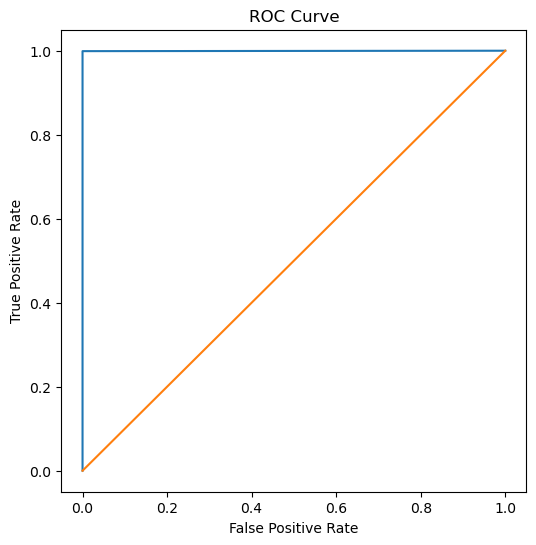

AUC for train set: 0.9995


In [58]:
fpr, tpr, threshold = metrics.roc_curve(y_train1, ypred_xgb_imb_tr)
area_under_curve = metrics.auc(fpr, tpr)
fig, axes = plt.subplots(figsize=(6,6))
axes.plot(fpr, tpr)
axes.set_xlabel('False Positive Rate')
axes.set_ylabel('True Positive Rate')
axes.plot([0,1],[0,1])
axes.set_title('ROC Curve')
plt.show()
print('AUC for train set:', area_under_curve)

In [59]:
ypred_xgb_imb_te=xgb_imb.predict(X_test)

In [60]:
cm7=confusion_matrix(y_test1, ypred_xgb_imb_te)
print(cm7)
print('Accuracy on test set:', accuracy_score(y_test1, ypred_xgb_imb_te))
print('Misclassification rate on test set:', 1-accuracy_score(y_test1, ypred_xgb_imb_te))

[[15577    48]
 [   63   312]]
Accuracy on test set: 0.9930625
Misclassification rate on test set: 0.006937500000000041


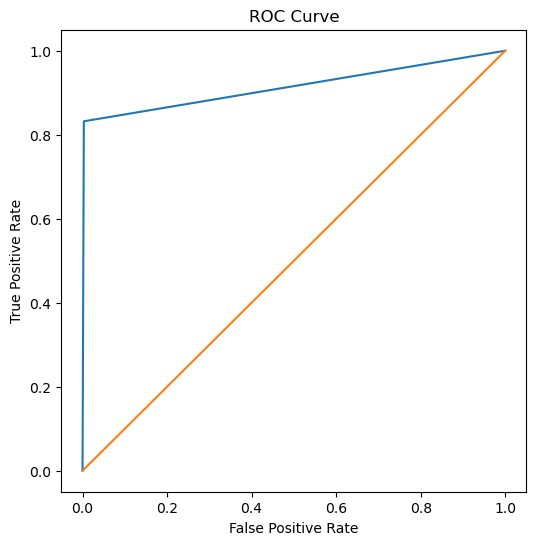

AUC for test set: 0.9144639999999999


In [61]:
fpr, tpr, threshold = metrics.roc_curve(y_test1, ypred_xgb_imb_te)
area_under_curve = metrics.auc(fpr, tpr)
fig, axes = plt.subplots(figsize=(6,6))
axes.plot(fpr, tpr)
axes.set_xlabel('False Positive Rate')
axes.set_ylabel('True Positive Rate')
axes.plot([0,1],[0,1])
axes.set_title('ROC Curve')
plt.show()
print('AUC for test set:', area_under_curve)

Train error = 0.999983 and test error = 0.99306

XGBoost with SMOTE works better as the no of true positives in SMOTE with XGBoost model is 312 whereas no of true positives in XGBoost is 294.

## 2. ISLR 6.6.3

Q 2 (a)
Steadily decrease:
All betas increase from 0 to their least square estimate values as s keeps increasing. Training error is maximum at the start and gradually decreases.

Q 2 (b)
Decrease initially then eventually start increasing in a U shape: Beta assumes non-zero values and model fits the test data well as s increases, decreasing the test RSS. However, as beta increases, it starts to overfit on the training data and hence produced higher test RSS.

Q 2 (c)
Steadily increase: When s=0, the model predicts a constant and has almost no variance. However, as s increases the beta values become highly dependent on the training data, thus the variance keeps increasing

Q 2 (d)
Steadily decrease: When s=0, the model effectively predicts a constant and has a lot of bias. Thus bias is high. However, as s increases the beta values become non-zero and highly dependent on the training data, thus the bias keeps decreasing.

Q 2 (e)
Remains constant: The irreducible error is constant and does not depend on the value of s.

## 3. ISLR 6.6.5

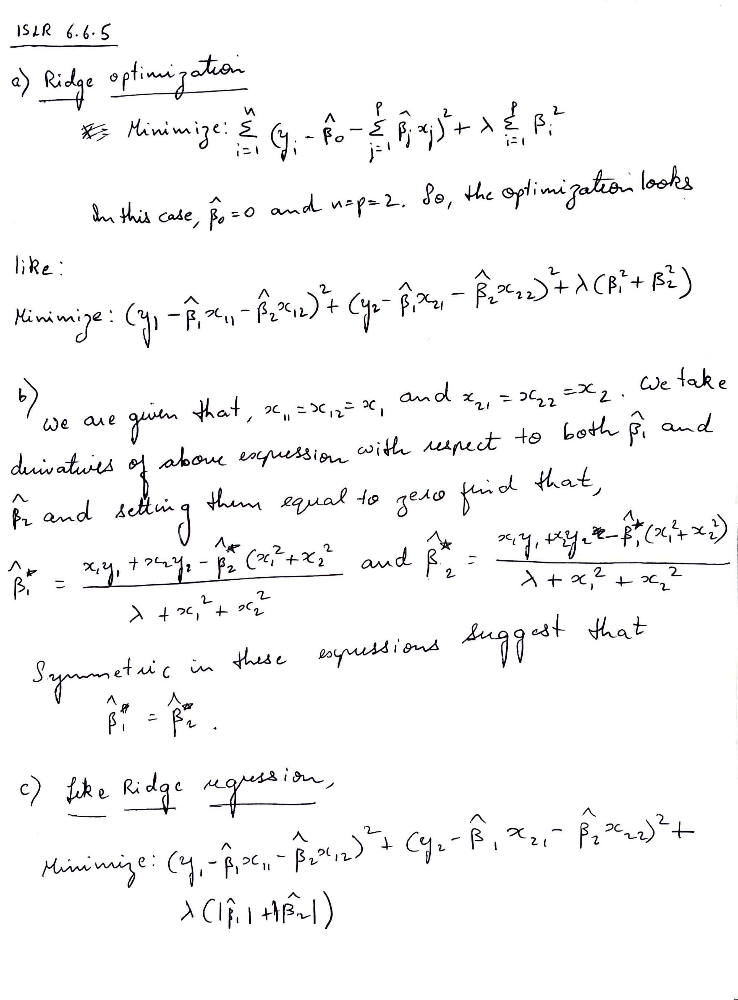

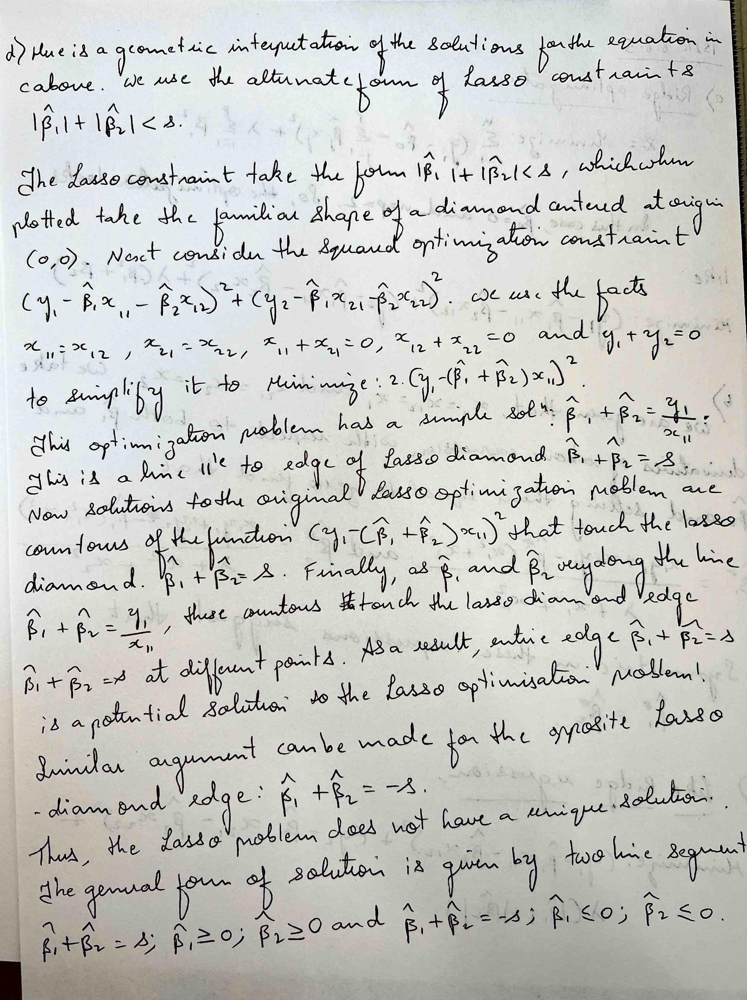

## 4. ISLR 8.4.5

There are 2 approaches as follows:
1. Majority Voting: P(Class is Red | X) < 0.5 = 4 P(Class is Red | X) >= 0.5 = 6.
   Since majority of the cases have P>=0.5, X is classified as red

2. Average Probability: P(Class is Red | X) = 4.5/10 P(Class is Red | X) = 0.45. Since average probability is P<0.5, X is classified as green

## 5. ISLR 9.7.3

In [62]:
df_islr = pd.DataFrame({'X1': [3,2,4,1,2,4,4], 'X2': [4,2,4,4,1,3,1], 'Y':['Red', 'Red', 'Red', 'Red', 'Blue', 'Blue', 'Blue']})
df_islr

,X1,X2,Y
0,3,4,Red
1,2,2,Red
2,4,4,Red
3,1,4,Red
4,2,1,Blue
5,4,3,Blue
6,4,1,Blue


In [63]:
X = df_islr[['X1', 'X2']]
Y = df_islr['Y']

In [64]:
clf = svm.SVC(kernel="linear", C=1000)
clf.fit(X, Y)

SVC(C=1000, kernel='linear')

In [65]:
clf1 = svm.SVC(kernel="linear", C=1000)
clf1.fit(X, Y)

SVC(C=1000, kernel='linear')

Optimal Hyperplane

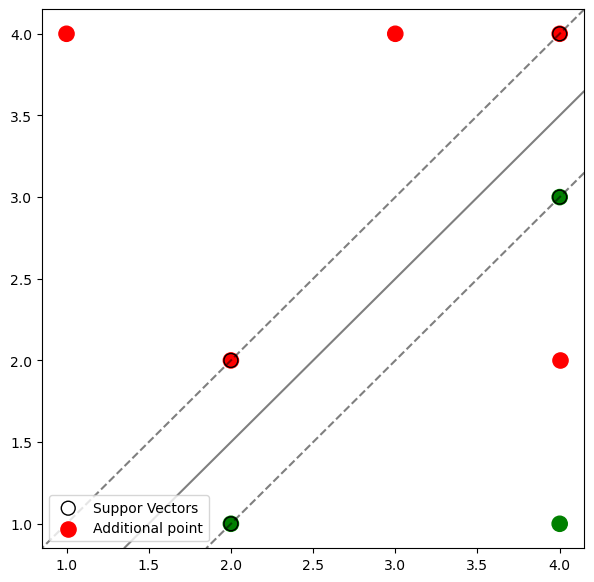

In [66]:
fig, ax = plt.subplots(figsize=(7, 7))

colors = np.where(df_islr.Y == 'Red', 'r', 'g')
plt.scatter(df_islr.X1, df_islr.X2, s=120, c=colors)

# creating grid to evaluate model
xlim = ax.get_xlim()
ylim = ax.get_ylim()
xx = np.linspace(xlim[0], xlim[1], 30)
yy = np.linspace(ylim[0], ylim[1], 30)
YY, XX = np.meshgrid(yy, xx)
xy = np.vstack([XX.ravel(), YY.ravel()]).T
Z = clf.decision_function(xy).reshape(XX.shape)

# forming hyperplane
lines1 = ax.contour(XX, YY, Z, colors='k', levels=[-1, 0, 1], alpha=0.5,linestyles=['--', '-', '--'], label="Decision Boundary")

# plotting support vectors
ax.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1], s=100,linewidth=1, facecolors='none', edgecolors='k', label="Suppor Vectors")


# point that makes the data not linear-separable
ax.scatter([4.0], [2.0], color='r', marker='o', s=120, label="Additional point")

ax.legend()
plt.show()



In [67]:
print("The value of intercept/beta0 is",round(clf.intercept_[0]))

The value of intercept/beta0 is 1


In [68]:
print("The value of beta1 is", round(clf.coef_[0][0]))

The value of beta1 is -2


In [69]:
print("The value of beta2 is", round(clf.coef_[0][1]))

The value of beta2 is 2


Not Optimal Hyperplane

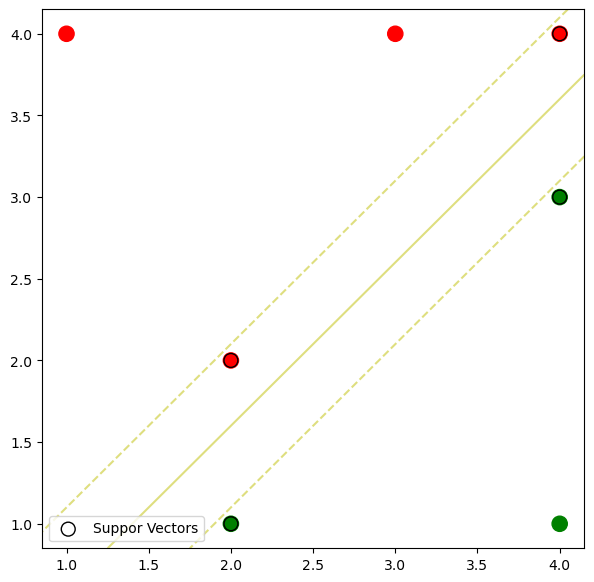

In [70]:
fig, ax = plt.subplots(figsize=(7, 7))

colors = np.where(df_islr.Y == 'Red', 'r', 'g')
plt.scatter(df_islr.X1, df_islr.X2, s=120, c=colors)

# creating grid to evaluate model
xlim = ax.get_xlim()
ylim = ax.get_ylim()
xx = np.linspace(xlim[0], xlim[1], 30)
yy = np.linspace(ylim[0], ylim[1], 30)
YY, XX = np.meshgrid(yy, xx)
xy = np.vstack([XX.ravel(), YY.ravel()]).T
Z1= clf1.decision_function(xy).reshape(XX.shape)

# a hyperplane that is not optimal
lines2 = ax.contour(XX, YY, Z1- 0.2, colors='y', levels=[-1, 0, 1], alpha=0.5,linestyles=['--', '-', '--'], label="Decision Boundary")
ax.scatter(clf1.support_vectors_[:, 0], clf1.support_vectors_[:, 1], s=100,linewidth=1, facecolors='none', edgecolors='k', label="Suppor Vectors")
ax.legend()
plt.show()

In [71]:
print("The value of intercept/beta0 is",clf1.intercept_[0])

The value of intercept/beta0 is 0.9997070312500025


In [72]:
print("The value of beta1 is", clf1.coef_[0][0])

The value of beta1 is -1.9994140625000014


In [73]:
print("The value of beta2 is", clf1.coef_[0][1])

The value of beta2 is 1.9994140625000014


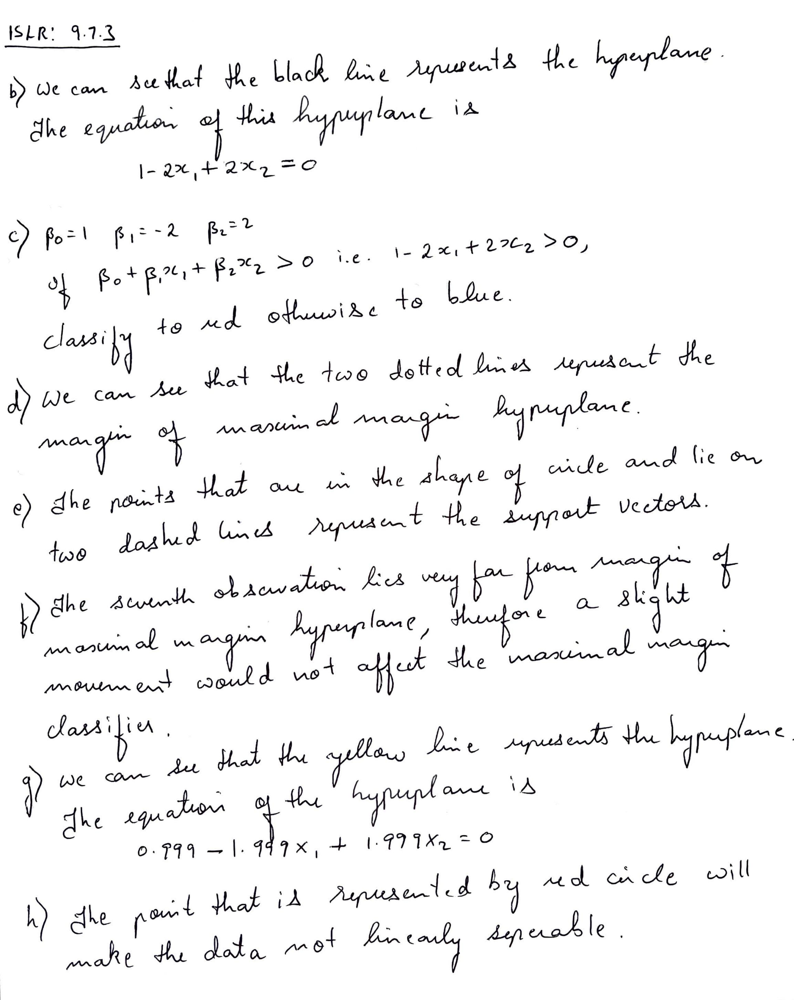